In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re
from wordcloud import WordCloud

In [2]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Conv1D, MaxPool1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

In [5]:
fake=pd.read_csv("Fake.csv")

In [6]:
fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [7]:
fake.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [10]:
fake['subject'].value_counts()

,count
subject,
News,9050
politics,6841
left-news,4459
Government News,1570
US_News,783
Middle-east,778


<Axes: xlabel='subject', ylabel='count'>

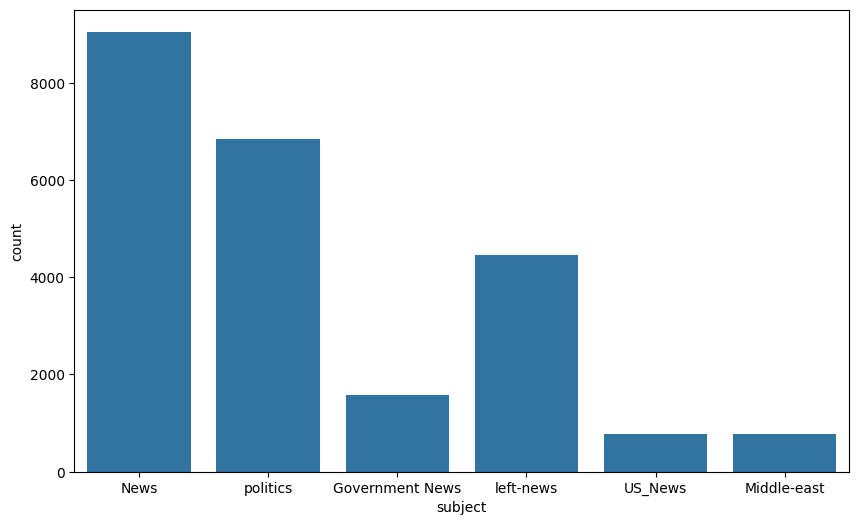

In [13]:
plt.figure(figsize=(10,6) )
sns.countplot(x='subject',data=fake)

In [16]:
text=' '.join(fake['text'].tolist())

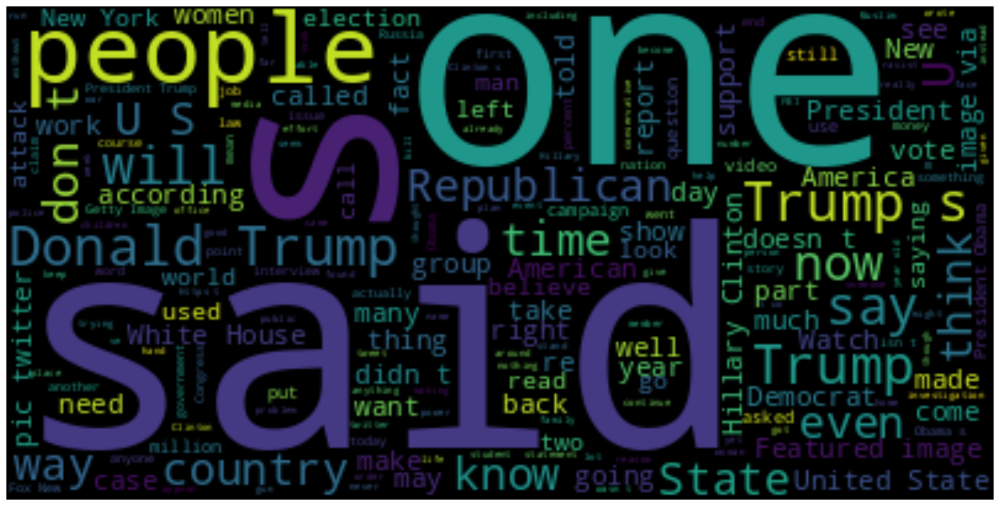

In [21]:
wordcloud=WordCloud().generate(text)
fig=plt.figure(figsize=(20,10))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

In [22]:
real=pd.read_csv('True.csv')

In [23]:
real.head()

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"


In [24]:
text=' '.join(real['text'].tolist())

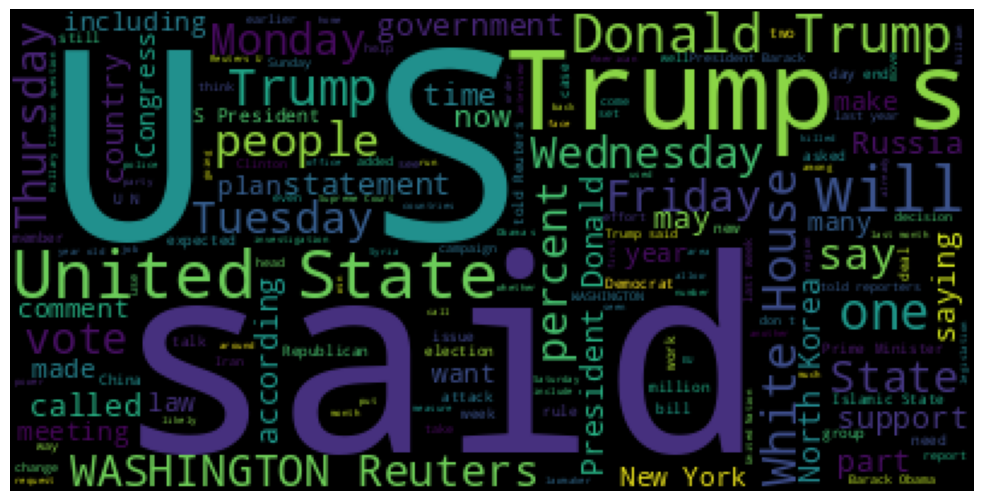

In [28]:
wordcloud=WordCloud().generate(text)
fig=plt.figure(figsize=(10,10))
plt.imshow(wordcloud)
plt.tight_layout(pad=0)
plt.axis('off')
plt.show()

In [43]:
unknown_publishers=[]
for index,row in enumerate(real.text.values):
  try:
    record=row.split('-',maxsplit=1)
    record[1]
    assert(len(record[0])<120)
  except:
    unknown_publishers.append(index)

In [44]:
len(unknown_publishers)

221

In [45]:
real.iloc[unknown_publishers].text

,text
7,The following statements were posted to the ve...
8,The following statements were posted to the ve...
12,The following statements were posted to the ve...
13,The following statements were posted to the ve...
14,"(In Dec. 25 story, in second paragraph, corre..."
...,...
20135,(Story corrects to million from billion in pa...
20500,"(This Sept 8 story corrects headline, clarifi..."
20667,"(Story refiles to add dropped word not , in ..."
21246,(Story corrects third paragraph to show Mosul...


In [40]:
real.iloc[8970]

,8970
title,Graphic: Supreme Court roundup
text,
subject,politicsNews
date,"June 16, 2016"


In [41]:
real=real.drop(8970,axis=0)

In [48]:
publisher=[]
temp_text=[]
for index,row in enumerate(real.text.values):
  if index in unknown_publishers:
    temp_text.append(row)
    publisher.append('Unknown')
    continue
  else:
    record=row.split('-',maxsplit=1)
    publisher.append(record[0].strip())
    temp_text.append(record[1].strip())

In [49]:
real['publisher']=publisher
real['text']=temp_text

In [50]:
real.head()

,title,text,subject,date,publisher
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction ...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fir...,politicsNews,"December 29, 2017",WASHINGTON (Reuters)
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links bet...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos tol...,politicsNews,"December 30, 2017",WASHINGTON (Reuters)
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Post...,politicsNews,"December 29, 2017",SEATTLE/WASHINGTON (Reuters)


In [52]:
real.shape

(21416, 5)

In [54]:
empty_fake_index=[ index for index, text in enumerate( fake.text.tolist()) if str(text).strip()==""]

In [55]:
fake.iloc[empty_fake_index]

,title,text,subject,date
10923,TAKE OUR POLL: Who Do You Think President Trum...,,politics,"May 10, 2017"
11041,Joe Scarborough BERATES Mika Brzezinski Over “...,,politics,"Apr 26, 2017"
11190,WATCH TUCKER CARLSON Scorch Sanctuary City May...,,politics,"Apr 6, 2017"
11225,MAYOR OF SANCTUARY CITY: Trump Trying To Make ...,,politics,"Apr 2, 2017"
11236,SHOCKER: Public School Turns Computer Lab Into...,,politics,"Apr 1, 2017"
...,...,...,...,...
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"


In [57]:
real['text']=real['title']+" "+real['text']
fake['text']=fake['title']+" "+fake['text']

In [59]:
real['text']=real['text'].apply(lambda x: str(x).lower())
fake['text']=fake['text'].apply(lambda x: str(x).lower())

In [61]:
real['class']=1
fake['class']=0

In [62]:
real.columns

Index(['title', 'text', 'subject', 'date', 'publisher', 'class'], dtype='object')

In [63]:
real=real[['text','class']]
fake=fake[['text','class']]

In [67]:
data = pd.concat([real, fake], ignore_index=True)

In [68]:
data

,text,class
0,"as u.s. budget fight looms, republicans flip t...",1
1,u.s. military to accept transgender recruits o...,1
2,senior u.s. republican senator: 'let mr. muell...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge 'much mor...,1
...,...,...
44892,mcpain: john mccain furious that iran treated ...,0
44893,justice? yahoo settles e-mail privacy class-ac...,0
44894,sunnistan: us and allied ‘safe zone’ plan to t...,0
44895,how to blow $700 million: al jazeera america f...,0


In [69]:
data.sample(7)

,text,class
25048,bernie sanders gets brutally honest on ‘conan...,0
24713,sad! it shouldn’t be news that trump got inte...,0
3646,senate intelligence to 'vigorously pursue' fly...,1
110,trump defends tax plan as 'great christmas gif...,1
36747,very funny video: sarah palin advises trump to...,0
14458,"china wants bangladesh, myanmar to solve rohin...",1
16874,brazil's temer says pension reform might not p...,1


In [71]:
!pip install spacy==2.2.3
!python -m spacy download en_core_web_sm
!pip install beautifulsoup4==4.9.1
!pip install textblob==0.15.3
!pip install git+https://github.com/laxmimerit/preprocess_kgptalkie.git --upgrade --force-reinstall



  Using cached spacy-2.2.3.tar.gz (5.9 MB)
  Installing build dependencies ... done
  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Getting requirements to build wheel ... error
error: subprocess-exited-with-error

× Getting requirements to build wheel did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 103.6 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restar

In [79]:
!pip install googletrans==3.1.0a0
import preprocess_kgptalkie as ps

  Preparing metadata (setup.py) ... done
  Created wheel for googletrans: filename=googletrans-3.1.0a0-py3-none-any.whl size=16353 sha256=4d3a9521e72cdb92d4d86908c8816fb509e48aafd553c7371fb440f3c127afe2
  Stored in directory: /root/.cache/pip/wheels/6a/e3/42/e57970ec354cbac26dde2659ec8efb09e668adcefd80afc1e3
Successfully built googletrans
  Attempting uninstall: googletrans
    Found existing installation: googletrans 4.0.0rc1
    Uninstalling googletrans-4.0.0rc1:
      Successfully uninstalled googletrans-4.0.0rc1


In [74]:
import preprocess_kgptalkie as ps

In [76]:
data['text']=data['text'].apply(lambda x: ps.remove_special_chars(x))

In [77]:
data.head()

,text,class
0,as us budget fight looms republicans flip thei...,1
1,us military to accept transgender recruits on ...,1
2,senior us republican senator let mr mueller do...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge much more...,1


In [80]:
!pip install gensim
import gensim

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.8/27.8 MB 33.6 MB/s eta 0:00:00


In [81]:
y=data['class'].values

In [84]:
X=[d.split() for d in data['text'].tolist()]

In [85]:
type(X[0])

list

In [86]:
print(X[0])

['as', 'us', 'budget', 'fight', 'looms', 'republicans', 'flip', 'their', 'fiscal', 'script', 'as', 'us', 'budget', 'fight', 'looms', 'republicans', 'flip', 'their', 'fiscal', 'script', 'the', 'head', 'of', 'a', 'conservative', 'republican', 'faction', 'in', 'the', 'us', 'congress', 'who', 'voted', 'this', 'month', 'for', 'a', 'huge', 'expansion', 'of', 'the', 'national', 'debt', 'to', 'pay', 'for', 'tax', 'cuts', 'called', 'himself', 'a', 'fiscal', 'conservative', 'on', 'sunday', 'and', 'urged', 'budget', 'restraint', 'in', '2018', 'in', 'keeping', 'with', 'a', 'sharp', 'pivot', 'under', 'way', 'among', 'republicans', 'us', 'representative', 'mark', 'meadows', 'speaking', 'on', 'cbs', 'face', 'the', 'nation', 'drew', 'a', 'hard', 'line', 'on', 'federal', 'spending', 'which', 'lawmakers', 'are', 'bracing', 'to', 'do', 'battle', 'over', 'in', 'january', 'when', 'they', 'return', 'from', 'the', 'holidays', 'on', 'wednesday', 'lawmakers', 'will', 'begin', 'trying', 'to', 'pass', 'a', 'fede

In [88]:
DIM=100
w2v_model=gensim.models.Word2Vec(sentences=X,vector_size=DIM,window=10,min_count=1)

In [91]:
len(w2v_model.wv.key_to_index)

230893

In [92]:
w2v_model.wv

In [96]:
w2v_model.wv.most_similar('us')

[('american', 0.5506958961486816),
 ('iran', 0.4975263178348541),
 ('iranian', 0.49375396966934204),
 ('apostolova', 0.47675076127052307),
 ('nato', 0.4689289629459381),
 ('natos', 0.4627194106578827),
 ('russian', 0.45231178402900696),
 ('washingtons', 0.45139411091804504),
 ('irans', 0.44903481006622314),
 ('pakistan', 0.4381355345249176)]

In [98]:
tokenizer=Tokenizer()
tokenizer.fit_on_texts(X)

In [99]:
X=tokenizer.texts_to_sequences(X)

In [100]:
X

[[18,
  29,
  455,
  463,
  8456,
  132,
  8125,
  40,
  1376,
  5194,
  18,
  29,
  455,
  463,
  8456,
  132,
  8125,
  40,
  1376,
  5194,
  1,
  417,
  3,
  4,
  303,
  76,
  6338,
  6,
  1,
  29,
  187,
  30,
  788,
  27,
  281,
  9,
  4,
  1114,
  2919,
  3,
  1,
  127,
  923,
  2,
  445,
  9,
  176,
  1151,
  175,
  399,
  4,
  1376,
  303,
  8,
  345,
  5,
  1122,
  455,
  7508,
  6,
  1140,
  6,
  1761,
  16,
  4,
  3415,
  7879,
  144,
  165,
  324,
  132,
  29,
  800,
  929,
  7857,
  685,
  8,
  2020,
  477,
  1,
  397,
  1779,
  4,
  564,
  593,
  8,
  170,
  683,
  50,
  383,
  28,
  17468,
  2,
  89,
  1296,
  63,
  6,
  412,
  61,
  32,
  762,
  25,
  1,
  8099,
  8,
  205,
  383,
  39,
  1442,
  355,
  2,
  921,
  4,
  170,
  455,
  6,
  4,
  463,
  306,
  2,
  22,
  1945,
  2,
  80,
  424,
  171,
  18,
  309,
  208,
  107,
  18,
  1,
  519,
  573,
  94,
  1784,
  1514,
  6,
  50,
  132,
  39,
  1022,
  2,
  374,
  348,
  3,
  187,
  37,
  68,
  12,
  5,
  19,
  132,
 

In [101]:
tokenizer.word_index

{'the': 1,
 'to': 2,
 'of': 3,
 'a': 4,
 'and': 5,
 'in': 6,
 'that': 7,
 'on': 8,
 'for': 9,
 's': 10,
 'is': 11,
 'trump': 12,
 'he': 13,
 'said': 14,
 'it': 15,
 'with': 16,
 'was': 17,
 'as': 18,
 'his': 19,
 'by': 20,
 'has': 21,
 'be': 22,
 'not': 23,
 'have': 24,
 'from': 25,
 'at': 26,
 'this': 27,
 'are': 28,
 'us': 29,
 'who': 30,
 'an': 31,
 'they': 32,
 'but': 33,
 'i': 34,
 'we': 35,
 'would': 36,
 'president': 37,
 'about': 38,
 'will': 39,
 'their': 40,
 'had': 41,
 'you': 42,
 't': 43,
 'been': 44,
 'were': 45,
 'people': 46,
 'more': 47,
 'or': 48,
 'after': 49,
 'which': 50,
 'she': 51,
 'her': 52,
 'one': 53,
 'if': 54,
 'out': 55,
 'its': 56,
 'all': 57,
 'what': 58,
 'state': 59,
 'new': 60,
 'when': 61,
 'also': 62,
 'over': 63,
 'up': 64,
 'house': 65,
 'no': 66,
 'there': 67,
 'donald': 68,
 'clinton': 69,
 'obama': 70,
 'our': 71,
 'states': 72,
 'government': 73,
 'can': 74,
 'just': 75,
 'republican': 76,
 'him': 77,
 'than': 78,
 'so': 79,
 'other': 80,
 'so

In [102]:
[len(x)for x in X]

[763,
 637,
 474,
 391,
 871,
 608,
 554,
 148,
 110,
 84,
 412,
 633,
 114,
 196,
 372,
 460,
 707,
 191,
 404,
 229,
 535,
 921,
 428,
 374,
 702,
 383,
 363,
 280,
 85,
 442,
 186,
 236,
 105,
 347,
 1129,
 849,
 564,
 478,
 476,
 107,
 189,
 333,
 595,
 80,
 417,
 374,
 626,
 369,
 94,
 412,
 89,
 973,
 665,
 427,
 406,
 393,
 228,
 171,
 400,
 628,
 499,
 254,
 860,
 380,
 638,
 660,
 1311,
 440,
 409,
 154,
 221,
 1115,
 84,
 85,
 598,
 859,
 768,
 796,
 357,
 706,
 490,
 425,
 92,
 430,
 139,
 1395,
 108,
 467,
 368,
 96,
 73,
 118,
 665,
 360,
 236,
 89,
 331,
 440,
 357,
 571,
 426,
 864,
 102,
 344,
 146,
 211,
 414,
 100,
 1135,
 1004,
 398,
 124,
 81,
 448,
 607,
 98,
 89,
 647,
 260,
 263,
 321,
 213,
 170,
 301,
 403,
 438,
 411,
 727,
 629,
 294,
 113,
 98,
 96,
 90,
 84,
 522,
 416,
 257,
 733,
 775,
 243,
 430,
 441,
 554,
 429,
 372,
 320,
 843,
 700,
 104,
 110,
 120,
 371,
 100,
 68,
 302,
 234,
 297,
 379,
 119,
 474,
 590,
 952,
 1075,
 273,
 470,
 474,
 507,
 99,

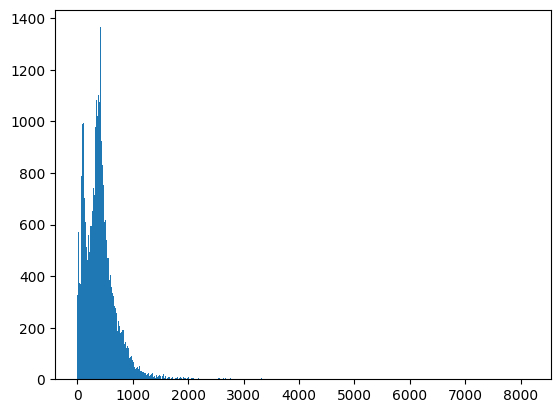

In [103]:
plt.hist([len(x)for x in X],bins=700)
plt.show()

In [104]:
nos=np.array([len(x)for x in X])
len(nos[nos>1000])

1628

In [105]:
maxlen=700
X=pad_sequences(X,maxlen=maxlen)

In [107]:
vocab_size=len(tokenizer.word_index)+1
vocab=tokenizer.word_index

In [110]:
def get_weight_matrix(model):
  weight_matrix=np.zeros((vocab_size,DIM))
  for word,i in vocab.items():
    weight_matrix[i]=model.wv[word]

  return weight_matrix

In [111]:
embedding_vectors=get_weight_matrix(w2v_model)

In [112]:
embedding_vectors.shape

(230894, 100)

In [125]:

model=Sequential()
model.add(Embedding(vocab_size,output_dim=DIM,weights=[embedding_vectors],input_length=maxlen,trainable=False))
model.add(LSTM(units=128))
model.add(Dense(units=1,activation='sigmoid'))
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/embedding.py:100: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


In [126]:
model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_6 (Embedding)         │ ?                      │    23,089,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_6 (LSTM)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,089,400 (88.08 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,089,400 (88.08 MB)

In [127]:
model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_6 (Embedding)         │ ?                      │    23,089,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_6 (LSTM)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,089,400 (88.08 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,089,400 (88.08 MB)

In [128]:
X_train,X_test,y_train,y_test=train_test_split(X,y)

In [129]:
model.fit(X_train,y_train,validation_split=0.3,epochs=6)

Epoch 1/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - accuracy: 0.9479 - loss: 0.1426 - val_accuracy: 0.9756 - val_loss: 0.0703
Epoch 2/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - accuracy: 0.9818 - loss: 0.0543 - val_accuracy: 0.9887 - val_loss: 0.0347
Epoch 3/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - accuracy: 0.9898 - loss: 0.0296 - val_accuracy: 0.9913 - val_loss: 0.0271
Epoch 4/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - accuracy: 0.9936 - loss: 0.0190 - val_accuracy: 0.9935 - val_loss: 0.0215
Epoch 5/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - accuracy: 0.9962 - loss: 0.0117 - val_accuracy: 0.9936 - val_loss: 0.0192
Epoch 6/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - accuracy: 0.9961 - loss: 0.0104 - val_accuracy: 0.9918 - val_loss: 0.0263


In [130]:
y_pred=(model.predict(X_test)>=0.5).astype(int)

351/351 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step


In [131]:
accuracy_score(y_test,y_pred)

0.9900222717149221

In [132]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      5876
           1       0.99      0.98      0.99      5349

    accuracy                           0.99     11225
   macro avg       0.99      0.99      0.99     11225
weighted avg       0.99      0.99      0.99     11225



In [133]:
x=['this is Ashish']

In [136]:
model.save('my_fake_news_model_research.keras')
print("Model saved successfully to 'my_fake_news_model_research.keras'")

Model saved successfully to 'my_fake_news_model_research.keras'


In [ ]:
from google.colab import drive
drive.mount('/content/drive')